In [1]:
import pandas as pd
import numpy as np

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#!unzip "drive/MyDrive/dataset/dog-breed-identification.zip" -d "drive/MyDrive/dataset/"

# 🐶 End-to-end multi class breed classification

This notebook builds a multi class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem
Identifying the breed of a given image of a dog.

## 2. Data
The data we are using is kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## Evaluation
The evaluation is a file with prediction probablities for each dog breed of each test image

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## Features
Some information about the data:
* We're dealing with images (unstructured data) so it's best we use deep learning/transfer learning.
* Total 120 breeds of the dog (total 120 different classes)
* There are around 10,000+ images in test set (these images have no labels, because we want to predict them)

### Getting our workspace ready

* import tenserflow 2.x ✅
* import tenserflow hub ✅
* make sure we are using GPU

In [4]:
pip install tensorflow_hub

In [5]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ",tf.__version__)
print("TF hub version: ",hub.__version__)

TF version:  2.19.0
TF hub version:  0.16.1


In [6]:
# Check for GPU availablity
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Getting our data ready (turning into tensors)

In all ML model, our data hsa to be in numerical format. So first we will turn our images into tensors(numerical representation)



In [7]:
# Checkout the labels of our data
labels_csv=pd.read_csv("drive/MyDrive/dataset/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


<Axes: xlabel='breed'>

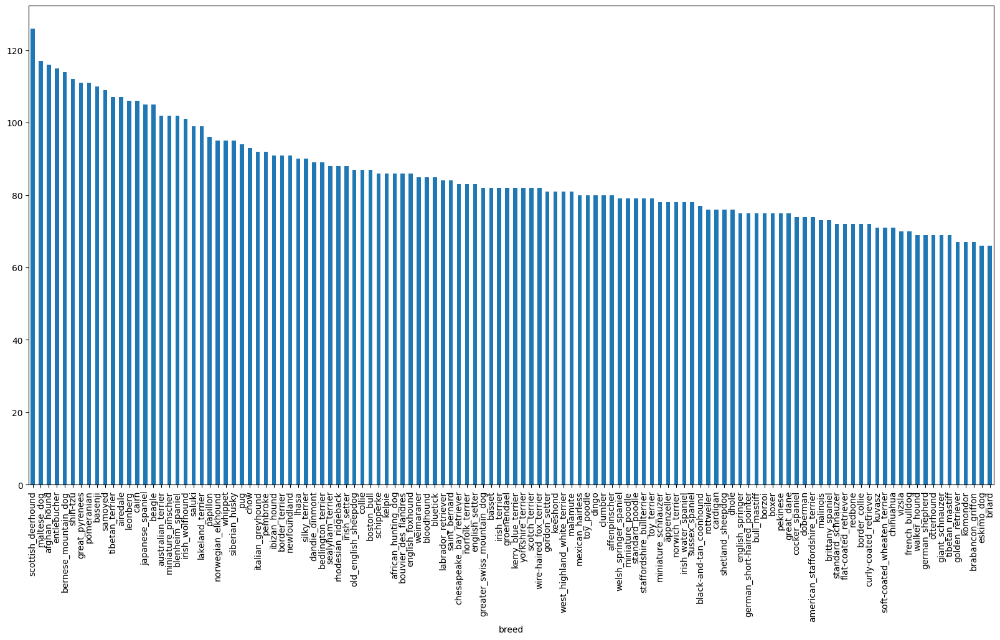

In [9]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [10]:

labels_csv["breed"].value_counts().median()

82.0

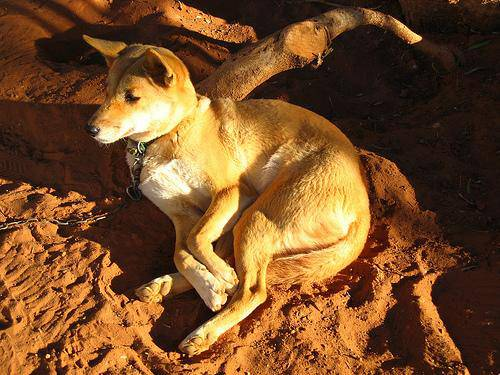

In [11]:

# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/dataset/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and their labels
Getting list of all of our image file pathnames


In [12]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [13]:
# Create pathname from Image ID's
filenames=["drive/MyDrive/dataset/train/"+fname+".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/dataset/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dataset/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dataset/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dataset/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dataset/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dataset/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dataset/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dataset/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dataset/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dataset/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [14]:
#Check wether the no of filenames matches no of actual image files
import os
if len(os.listdir("drive/MyDrive/dataset/train/"))==len(filenames):
  print("Filenames match actual no of files! Proceed")
else:
  print("Filenames do not match actual no of files! Check data")

Filenames match actual no of files! Proceed


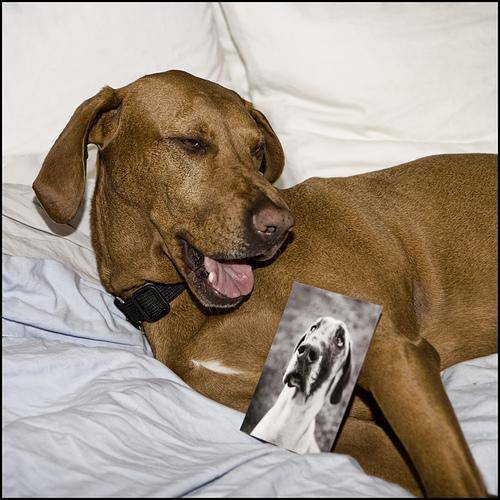

In [15]:
#One more check
Image(filenames[100])

In [16]:
labels_csv["breed"][100]

'rhodesian_ridgeback'

In [17]:
# for i in range(0,3):
#   display(Image(filenames[i]))

In [18]:
# Since we have created training image filepath in list, let's prepare labels list
labels=labels_csv["breed"]
labels=np.array(labels)
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [19]:
# Check if no of filenames matches to no of labels
len(filenames)==len(labels)

True

In [20]:
# Find the unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [21]:
# Turn every label into boolean array
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [22]:
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [23]:
len(boolean_labels)

10222

In [24]:
# Example of turning boolan label into integer
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # convert array into integer

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


##Creating our own validation set

As the kaggle dataset do not have validation set we are going to create our own.

In [25]:
#set x and y variables
x=filenames
y=boolean_labels

In [26]:
#set no of images to use for experiment
NUM_IMAGES = 1000 # @param {"type":"slider","min":1000,"max":10000,"step":1000}

In [27]:
#split data into train and validation set
np.random.seed(42)
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],
                                              test_size=0.2,random_state=42)
k=len(x_train)
l=len(x_val)
print(k,l)

800 200


In [28]:
x_train[:2],y_train[:2]

(['drive/MyDrive/dataset/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dataset/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, Fa

## Preprocessing images (Turning images into tensors)☕

To preprocess our image we are going to write fn:

1. Take image filepath as input                 
2. Use TenserFlow to read file and save it to var `image`    
3. Convert colour channel `image` from 0-255 to 0-1     
4. Turn the `image` (jpeg) into Tensors                             
5. Resize the `image` to be shape of (224,224)                  
5. Return the modified `image`


In [29]:
# # Before that we will see how to import image..
# from matplotlib.pyplot import imread
# image=imread(filenames[42])
# image.shape

In [30]:
#Define image size
IMG_SIZE=224

#Create fn for preprocess image
def preprocess_image(image_path):
  """
  Take as img file path and turn img into tensors
  """
  #read image file
  image=tf.io.read_file(image_path)

  #turn jpg img into numerical tensor with 3 color channel(red,green,blue)
  image=tf.image.decode_jpeg(image,channels=3)

  #convert the color channel from 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)

  #resize image to (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image


## Turning our data into batches 📦

Why turn data into batches?

Lets say we're trying to process 10000+ images in one go... they may not fit in memory

So thats why we do 32 (batch size)

⏩ In order to use tenserflow effectively, we need our data in form of Tensor Tuples which look like this: `(image, label)`

In [31]:
#Create simple fn to return tuple (image,label)
def get_image_label(image_path,label):
  image=preprocess_image(image_path)
  return image, label

In [32]:
get_image_label(x[42],y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now lets make fn to make `x` and `y` into batches!

In [33]:
BATCH_SIZE=32

def create_data_batches(x,y=None,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training but dosent shuffle if its validation data
  Also accepts test data as input (no labels)
  """

  #Id the data is test dataset, we dont have labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(preprocess_image).batch(BATCH_SIZE)
    return data_batch

  #If data is validation dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
      print("Creating validation data batches...")
      data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
      data=data.shuffle(buffer_size=len(x))
      data=data.map(get_image_label)
      data_batch=data.batch(BATCH_SIZE)
      return data_batch

In [34]:
#Create training and validation data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating validation data batches...
Creating validation data batches...


In [35]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches ✍



In [36]:
import matplotlib.pyplot as plt

#create fn for viewing images in data batch
def show_25_images(images,label):
  plt.figure(figsize=(13,13))
  #loop through 25 images
  for i in range(25):
    #create subplots(5 rows,5 cols)
    ax=plt.subplot(5,5,i+1)
    #dispaly image
    plt.imshow(images[i])
    plt.title(unique_breeds[label[i].argmax()])
    #turn plot lines off
    plt.axis("off")

In [37]:
#converts tenserflow dataset into NumPy iterator
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

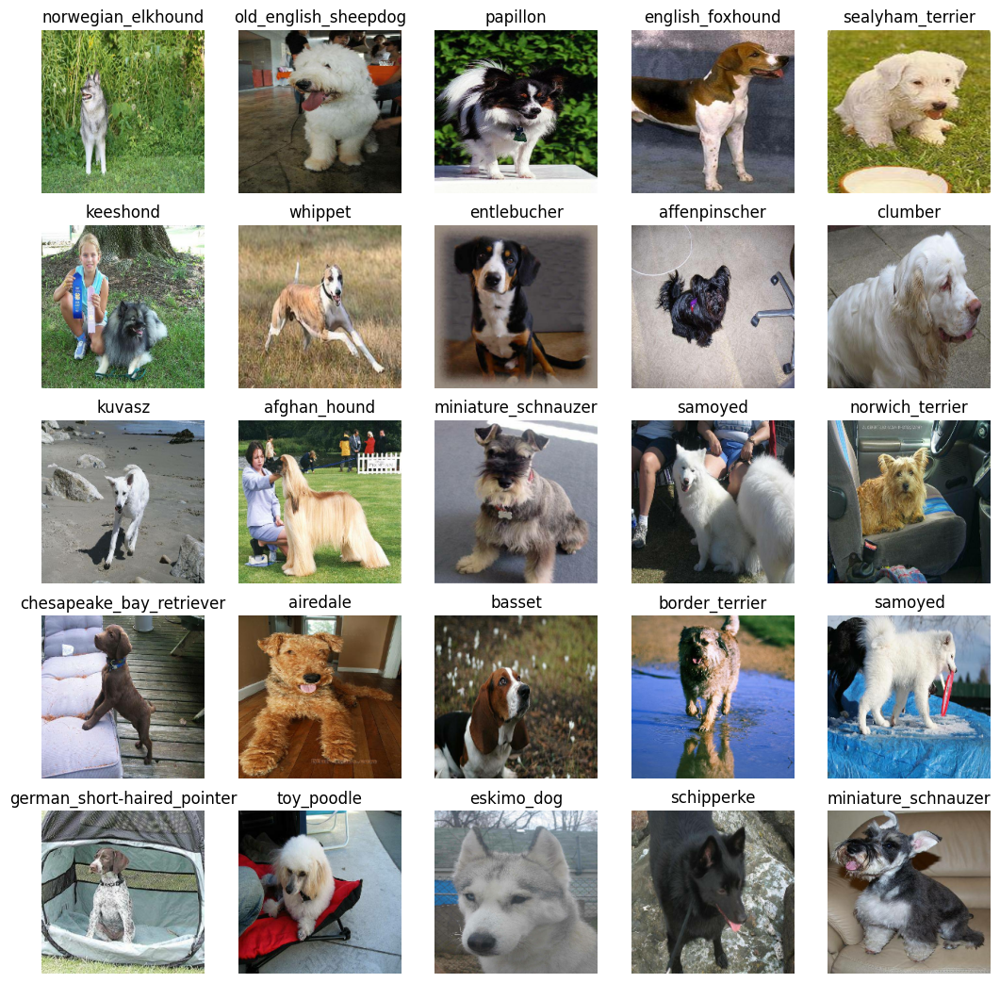

In [38]:
#now let's visualize the data in training set
show_25_images(train_images,train_labels)

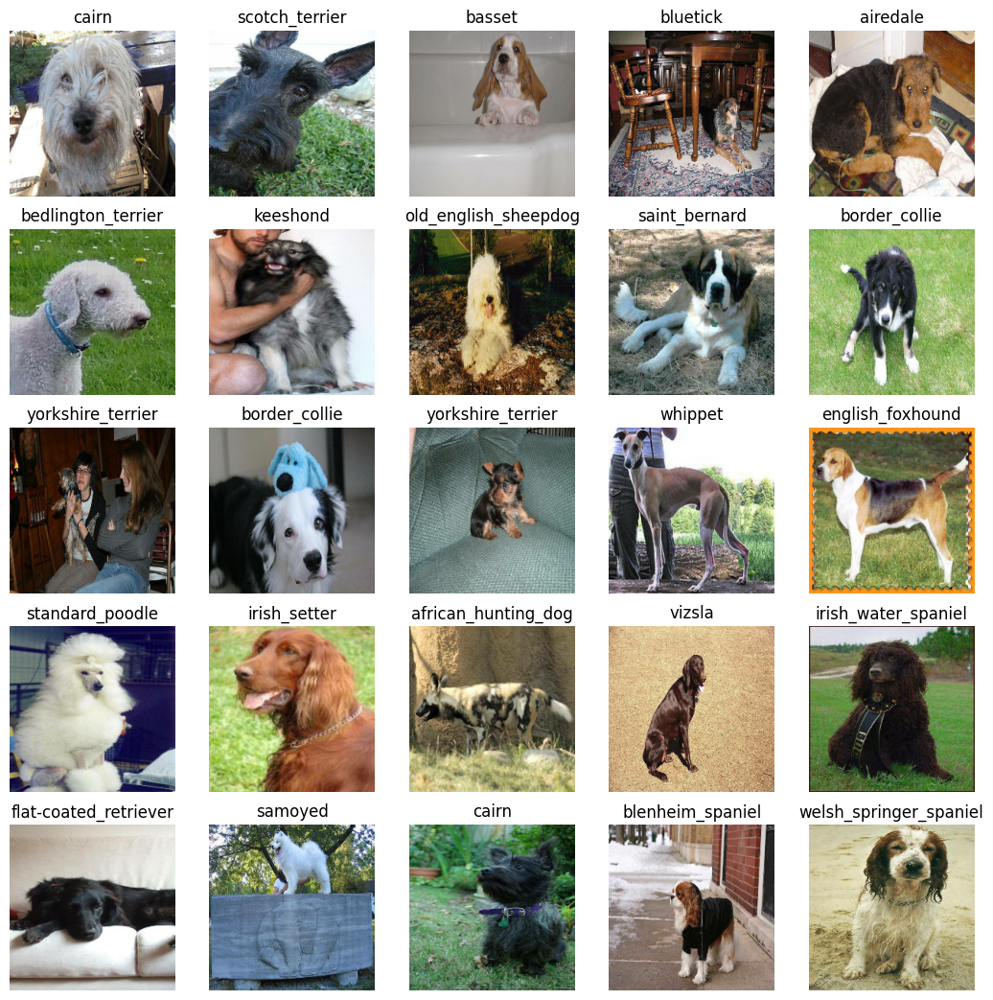

In [39]:
#visualize the data in validation dataset
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model 🤖

Before we build a model, there are few things we need to define:

---

*   The input shape (image shape, in form of tensors) to our model
*   The output shape (image labels, in the form of tensors) of our model
*   The URL of the model we want to use from TensorFlow Hub







In [40]:
#Setup input shape of the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
# batch, height, width, colour channels

#Setup output shape of the model
OUTPUT_SHAPE=len(unique_breeds)

#Setup model URL from TensorFlow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5"

Now put them together into a Keras deep learning model 🐕

Creating a function:
*  Takes the input shape,output shape and the model we've chosed as parameter.
*  Define the layers in a Keras model in sequential fashion.
*  Compiles the model (should be evaluate and improved)
*  Builds the model
*  Return the model

In [41]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with: ",MODEL_URL)

  #setup the model layers
  model=tf.keras.Sequential([
      tf.keras.layers.Lambda(lambda x: hub.KerasLayer(MODEL_URL)(x)), #layer 1 (input)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") #layer 2 (output)
  ])

  #Complie the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model

In [42]:
model=create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                 │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 153,720 (600.47 KB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 0 (0.00 B)

##Creating callbacks ⏳

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.



> We'll create 2 callback fn, one for tensorBoard which helps track our model progress and another for early stopping which prevents our model from training too long.

###TensorBoard Callback

We need to do 3 things:
*  Load tensorboard notebook extension
*  Create tensorboard callback which is able to save logs to directory and pass it to our model's `fit()` fn
*  Visualize our model training logs with the `%tensorboard` fn (we'll do after model training)

In [43]:
# TensorBoard Callback
# load tensorboard notebook extension
%load_ext tensorboard

In [44]:
import datetime

def create_tensorboard_callback():
  #create log directory for storing tensorboard logs
  logdir=os.path.join("drive/My Drive/dataset/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early stopping callback

Early stopping helps stop model from overfitting if certain evaluation metric stops improving.

In [45]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [46]:
NUM_EPOCHS = 50 # @param {"type":"slider","min":10,"max":100,"step":10}

In [47]:
print("GPU available" if tf.config.list_physical_devices("GPU") else "GPU not available")

GPU available


## Creating a function to train a model ✈

*  Create a model using `create_model()`
*  Setup tensorboard callback `create_tensorboard_callback()`
*  Call `fit()` fn on our model passing it training data, validation data, no of epochs, and callback fn we'd like to use
*  return model

In [48]:
def train_model():
  #Create model
  model=create_model()

  #create new tensorBoard session everytime we train model
  tensorboard=create_tensorboard_callback()

  #fit model to data
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard])

  return model

In [49]:
model=train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5
Epoch 1/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 160s 5s/step - accuracy: 0.0610 - loss: 4.7149 - val_accuracy: 0.3250 - val_loss: 3.3462
Epoch 2/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - accuracy: 0.6246 - loss: 2.0208 - val_accuracy: 0.5350 - val_loss: 2.1434
Epoch 3/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 200ms/step - accuracy: 0.9157 - loss: 0.7989 - val_accuracy: 0.6150 - val_loss: 1.6760
Epoch 4/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - accuracy: 0.9764 - loss: 0.4278 - val_accuracy: 0.6500 - val_loss: 1.4806
Epoch 5/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - accuracy: 0.9957 - loss: 0.2471 - val_accuracy: 0.6750 - val_loss: 1.3809
Epoch 6/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 180ms/step - accuracy: 0.9992 - loss: 0.1726 - val_accuracy: 0.6600 - val_loss: 1.3412
Epoch 7/50
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 190ms/step - accuracy: 0.9985 - loss: 0.1222 - val_accuracy: 0.7050 - val_loss: 1.2910
Epoch 8/50


### Checking tensorboard logs 💻

The magic fn `%tensorboard` will access the logs directory we created earlier and visualize its contents

In [50]:
%tensorboard --logdir drive/My\Drive/dataset/logs

Output hidden; open in https://colab.research.google.com to view.

#### Making and evaluating predictions using a trained model

In [51]:
predictions=model.predict(val_data, verbose=1)
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 12s 999ms/step


array([[3.1053808e-03, 3.1273125e-04, 4.7498418e-04, ..., 9.9019322e-05,
        2.1542050e-05, 2.7759310e-03],
       [1.4175868e-04, 3.5476650e-04, 1.0657199e-03, ..., 1.9635809e-05,
        2.6897609e-04, 8.4079757e-06],
       [5.3172744e-07, 1.7015660e-05, 1.8269577e-05, ..., 2.4876188e-05,
        4.9307796e-06, 4.8768660e-03],
       ...,
       [1.9929321e-06, 1.8886751e-05, 5.5495866e-06, ..., 1.5344916e-06,
        5.8838668e-06, 3.5966961e-05],
       [6.4624903e-05, 2.4893279e-06, 3.8673363e-05, ..., 5.9905415e-06,
        2.7440617e-06, 7.6235941e-04],
       [6.5190783e-05, 7.4315544e-06, 1.7450818e-04, ..., 1.0413375e-03,
        3.1656295e-04, 4.1736010e-04]], dtype=float32)

In [52]:
predictions.shape

(200, 120)

In [53]:
np.sum(predictions[1]) #the sum of all will be ~1

np.float32(1.0)

In [54]:
#First prediction
unique_breeds[predictions[0].argmax()]

'border_terrier'

##### Creating Text prediction function

**Note:** Prediction probablities are also known as confidence levels



In [55]:
def get_pred_label(prediction_probablities):
  """
  Turns an array of prediction probablities into array
  """
  return unique_breeds[np.argmax(prediction_probablities)]

pred_label=get_pred_label(predictions[0])
pred_label

'border_terrier'

In [56]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [57]:
# Now or validation data is still in batch dataset
# we need to unbatchify to make prediction on validation images and then compose it with true labels

def unbatchify(data):
  images=[]
  labels_=[]

  for image,label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return images,labels_

val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [58]:
get_pred_label(val_labels[1]) #truth label

'affenpinscher'

In [59]:
get_pred_label(predictions[1])

'scotch_terrier'

### Visualization of predictions 🎨

In [60]:
def plot_pred(prediction_probablities,labels,images,n=0):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob,true_label,image=prediction_probablities[n],labels[n],images[n]

  #get the pred label
  pred_label=get_pred_label(pred_prob)

  #plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change color depending on if prediction is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  #change text colour

  plt.title(f"{pred_label} {np.max(pred_prob)*100:.1f}% {true_label}",color=color)


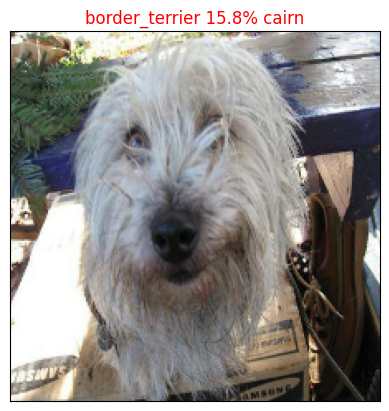

In [61]:
plot_pred(predictions,val_labels,val_images)

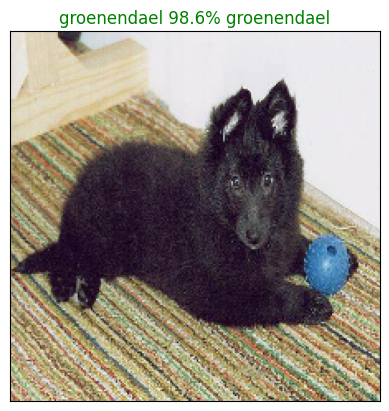

In [62]:
plot_pred(predictions,val_labels,val_images,77)

In [63]:
def plot_pred_conf(prediction_probablities,labels,images,n=0):
  """
  PLus top 10 highest prediction confidences along with truth label for sample n
  """
  pred_prob,true_label,image=prediction_probablities[n],labels[n],images[n]

  pred_label=get_pred_label(pred_prob)

  # Find top 10 prediction confidence index
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

  # Find top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]

  # Find top 10 prediction confidence labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #set plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
                   labels=top_10_pred_labels,
                   rotation="vertical")
  #change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

In [64]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.15782101, 0.11440303, 0.11328807, 0.10994616, 0.10722186,
       0.10672672, 0.08026014, 0.03169559, 0.03044349, 0.02722752],
      dtype=float32)

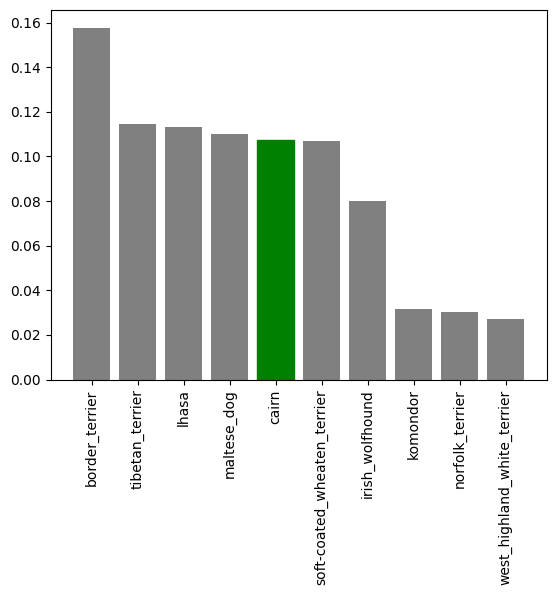

In [65]:
plot_pred_conf(predictions,val_labels,val_images)

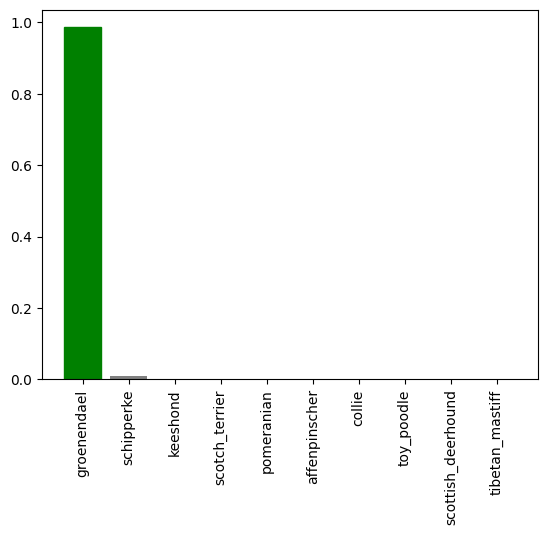

In [66]:
plot_pred_conf(predictions,val_labels,val_images,n=77)

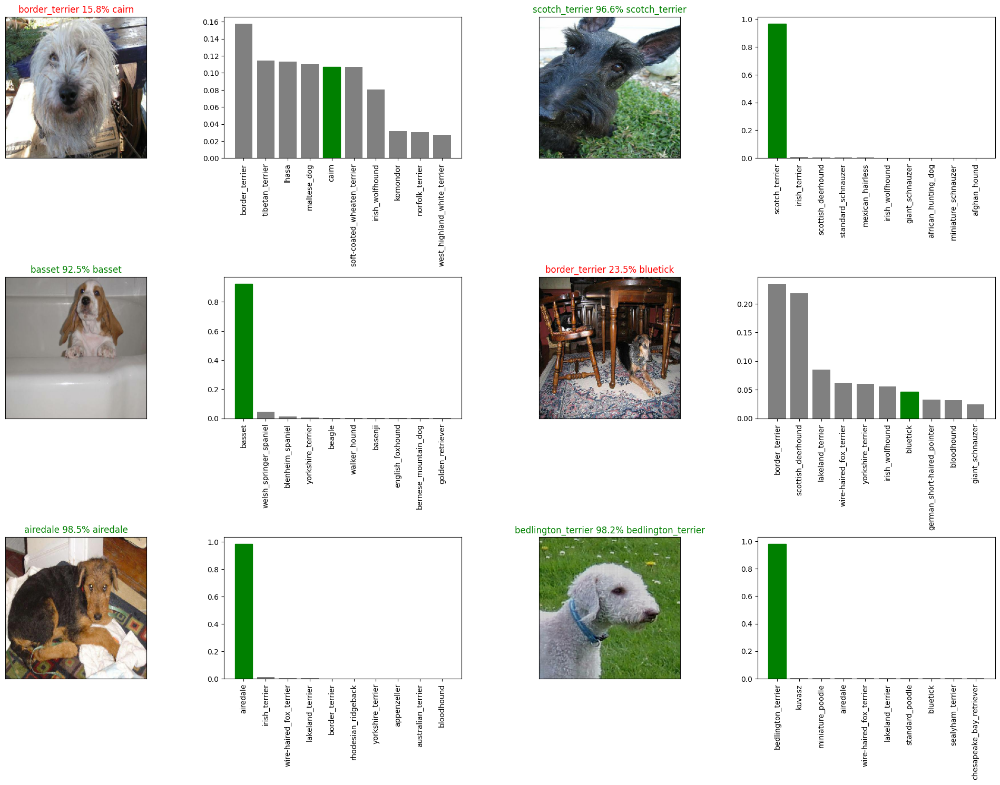

In [67]:
#See few images with top 10 predictions
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols

plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions,val_labels,val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions,val_labels,val_images,n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


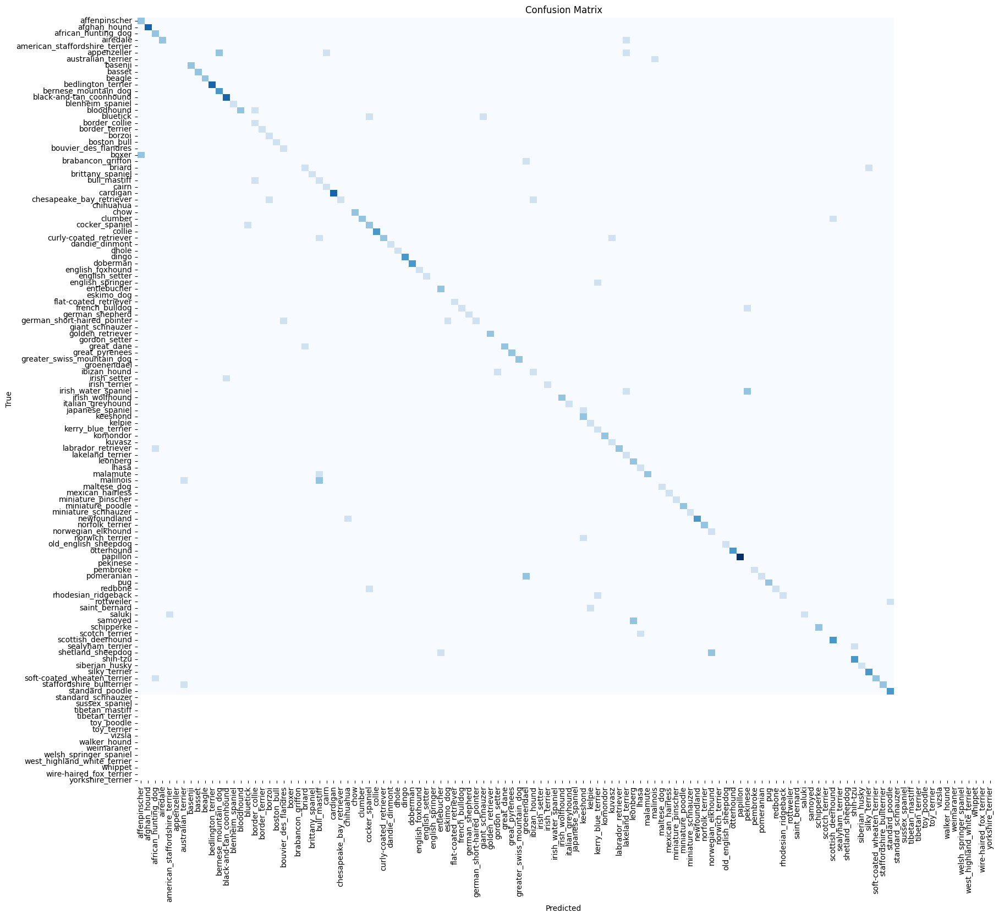

In [68]:
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Predicted class numbers
y_pred = np.argmax(predictions, axis=1)

y_pred_labels = [unique_breeds[i] for i in y_pred]
y_true_labels = val_labels


# 3. Confusion matrix
cm = confusion_matrix(y_true_labels, y_pred_labels)

# 4. Plot
plt.figure(figsize=(20, 18))
sns.heatmap(cm, cmap="Blues",cbar=False,
            xticklabels=unique_breeds,
            yticklabels=unique_breeds)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


In [69]:
from sklearn.metrics import classification_report
print(classification_report(y_true_labels, y_pred_labels))

                                precision    recall  f1-score   support

                 affenpinscher       0.50      1.00      0.67         2
                  afghan_hound       1.00      1.00      1.00         4
           african_hunting_dog       0.50      1.00      0.67         2
                      airedale       1.00      0.67      0.80         3
american_staffordshire_terrier       0.00      0.00      0.00         0
                   appenzeller       0.00      0.00      0.00         4
            australian_terrier       0.00      0.00      0.00         1
                       basenji       1.00      1.00      1.00         2
                        basset       1.00      1.00      1.00         2
                        beagle       1.00      1.00      1.00         2
            bedlington_terrier       1.00      1.00      1.00         4
          bernese_mountain_dog       0.60      1.00      0.75         3
              blenheim_spaniel       0.80      1.00      0.89  

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_

## Saving and reloading trained model ⚡

In [70]:
#Create a fn to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity
  """
  #create modelpath directory with current time
  modeldir=os.path.join("drive/My Drive/dataset/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  #save format of model
  model_path=modeldir+"-"+suffix+".keras"

  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [71]:
import tensorflow_hub as hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5"


In [72]:
#Create fn to load a trained model
import keras
import tensorflow_hub as hub

def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  keras.config.enable_unsafe_deserialization()
  model = tf.keras.models.load_model(
      model_path,
      custom_objects={"KerasLayer": hub.KerasLayer}
  )
  return model

In [73]:
save_model(model,suffix="1000-images-mobilenetv2")

Saving model to: drive/My Drive/dataset/models/20251127-05241764221045-1000-images-mobilenetv2.keras...


'drive/My Drive/dataset/models/20251127-05241764221045-1000-images-mobilenetv2.keras'

In [74]:
loaded_1000_image_model=load_model('drive/My Drive/dataset/models/20251126-13031764162235-1000-images-mobilenetv2.keras')

Loading saved model from: drive/My Drive/dataset/models/20251126-13031764162235-1000-images-mobilenetv2.keras


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 4 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [75]:
#Evaluate pre saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.7497 - loss: 1.0555


[1.1251202821731567, 0.7300000190734863]

## Training a model (on full data) 🦮

In [76]:
#Create data batch with full datset
full_data=create_data_batches(x,y)

Creating validation data batches...


In [77]:
#Create a model for full data
full_model=create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5


In [78]:
#Create full_model callbacks
full_model_tensorboard=create_tensorboard_callback()
#No validation set when training on full data, so we cant monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

In [79]:
#Fit the full model to full data
full_model.fit(x=full_data,
          epochs=NUM_EPOCHS,
          callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 67s 166ms/step - accuracy: 0.4919 - loss: 2.3311
Epoch 2/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 67s 132ms/step - accuracy: 0.8833 - loss: 0.4353
Epoch 3/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - accuracy: 0.9423 - loss: 0.2530
Epoch 4/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - accuracy: 0.9643 - loss: 0.1756
Epoch 5/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 131ms/step - accuracy: 0.9819 - loss: 0.1199
Epoch 6/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 135ms/step - accuracy: 0.9889 - loss: 0.0878
Epoch 7/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 131ms/step - accuracy: 0.9940 - loss: 0.0674
Epoch 8/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - accuracy: 0.9970 - loss: 0.0508
Epoch 9/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - accuracy: 0.9979 - loss: 0.0412
Epoch 10/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 132ms/step - accuracy: 0.9989 - loss: 0.0336
Epoch 11/50
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - accuracy: 0.9982 - loss: 0.0309
Epoch 12/50
320/320

In [80]:
save_model(full_model,suffix="full-image-set-mobilenetv2")

Saving model to: drive/My Drive/dataset/models/20251127-05381764221893-full-image-set-mobilenetv2.keras...


'drive/My Drive/dataset/models/20251127-05381764221893-full-image-set-mobilenetv2.keras'

## Making prediction on test dataset 🧪

To make predictions on test data, we will:
* Get the test images filename
* Convert filenames into test data batches
*  Make prediction array by passing test batches tp `predict()` method

In [85]:
# Load test data
test_path="drive/My Drive/dataset/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/dataset/test/dcbe4226672aa4af80c1e52a9bb78268.jpg',
 'drive/My Drive/dataset/test/e00e5f7f822fd670bba314f87cce8428.jpg',
 'drive/My Drive/dataset/test/e458d6133dd1b436b047f86910f7fe34.jpg',
 'drive/My Drive/dataset/test/e527455253416f809a73886b6003020d.jpg',
 'drive/My Drive/dataset/test/e40a39dd88f04b29ab3cb3a986503f8f.jpg',
 'drive/My Drive/dataset/test/e5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 'drive/My Drive/dataset/test/dce8d03553ab29570f67a28bf0ee0709.jpg',
 'drive/My Drive/dataset/test/e5a78d4d53fc5957cc9dedd318139d3d.jpg',
 'drive/My Drive/dataset/test/e14cc46044a0fb31554250b07c93bd48.jpg',
 'drive/My Drive/dataset/test/df903a0522873bebca93d1d93bc60bc4.jpg']

In [86]:
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [87]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [88]:
test_predictions=full_model.predict(test_data,verbose=1)

324/324 ━━━━━━━━━━━━━━━━━━━━ 286s 852ms/step


In [97]:
#Save predictions (NumPy array) to csv file(for access later)
np.savetxt("drive/My Drive/dataset/test_predictions.csv",test_predictions,delimiter=",")

In [98]:
test_predictions=np.loadtxt("drive/My Drive/dataset/test_predictions.csv",delimiter=",")

In [99]:
test_predictions[:10]

array([[2.03101635e-07, 3.66321556e-10, 4.70959185e-06, ...,
        3.61064212e-06, 3.07953596e-09, 1.54279675e-07],
       [6.74795220e-11, 9.25282184e-10, 2.01202416e-10, ...,
        1.05278360e-07, 1.25115733e-07, 3.05585979e-09],
       [3.32653071e-05, 1.86496240e-04, 4.87478360e-07, ...,
        7.44656390e-08, 7.73909895e-11, 2.25435779e-05],
       ...,
       [6.03226802e-09, 9.74693393e-09, 1.07039737e-08, ...,
        9.49797112e-08, 7.83095544e-09, 4.84808282e-08],
       [1.56519547e-10, 1.61061689e-06, 2.24440306e-08, ...,
        6.13125245e-11, 3.45939100e-09, 2.40833731e-09],
       [7.57844589e-07, 4.90364949e-09, 2.03497326e-08, ...,
        1.44279744e-08, 1.70987860e-07, 2.34525178e-05]])

In [100]:
test_predictions.shape

(10357, 120)

In [125]:
#Converting test dpredictions in kaggle format
preds_df=pd.DataFrame(test_predictions,columns=unique_breeds)
preds_df.insert(0,"id",[fname for fname in os.listdir(test_path)])
preds_df["id"] = preds_df["id"].str.replace(".jpg", "", regex=False)

preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dcbe4226672aa4af80c1e52a9bb78268,2.031016e-07,3.663216e-10,4.709592e-06,6.879999e-11,9.557683e-07,4.780571e-07,1.212337e-10,1.860154e-05,3.345292e-09,...,1.731847e-10,5.974940e-05,2.273272e-09,9.900740e-07,2.910257e-07,9.395257e-11,1.680375e-08,3.610642e-06,3.079536e-09,1.542797e-07
1,e00e5f7f822fd670bba314f87cce8428,6.747952e-11,9.252822e-10,2.012024e-10,4.883637e-07,1.977732e-09,2.392837e-05,1.068359e-09,1.076121e-07,8.478014e-11,...,1.286284e-10,4.287961e-06,3.368680e-09,4.877025e-08,3.334452e-06,2.317223e-09,4.143758e-10,1.052784e-07,1.251157e-07,3.055860e-09
2,e458d6133dd1b436b047f86910f7fe34,3.326531e-05,1.864962e-04,4.874784e-07,6.016830e-08,4.930499e-10,1.665755e-11,3.016242e-10,8.782040e-10,4.569915e-11,...,7.568944e-03,1.566726e-10,3.363881e-09,2.349334e-10,7.990635e-10,2.628344e-11,4.455422e-10,7.446564e-08,7.739099e-11,2.254358e-05
3,e527455253416f809a73886b6003020d,3.374133e-08,5.631143e-07,2.397067e-08,3.630052e-06,1.320354e-08,3.373312e-04,6.706819e-07,8.393524e-05,6.183737e-04,...,3.715188e-07,3.957382e-09,5.878329e-07,1.466984e-03,4.760198e-05,4.505786e-09,2.284448e-10,3.819310e-09,1.673032e-10,4.758861e-08
4,e40a39dd88f04b29ab3cb3a986503f8f,4.933267e-08,1.076610e-07,2.679788e-08,6.042114e-07,1.177072e-05,9.469694e-09,4.224148e-12,1.209757e-07,4.551167e-06,...,1.543499e-09,9.107050e-10,5.691717e-07,1.008818e-04,2.729168e-06,9.331527e-09,9.231248e-11,5.738992e-08,1.622932e-08,5.070102e-07


In [126]:
preds_df.to_csv("drive/My Drive/dataset/full-model-predictions-mobilenetv2.csv",index=False)

## Predict breed from single image 🌄



In [116]:
def predict_breed(image_path,model):
  """
  Takes an image path and a trained model
  Returns predicted dog breed
  """
  #preprocess image
  img=preprocess_image(image_path)

  #add batch dimension (1,224,224,3)
  img=tf.expand_dims(img,axis=0)

  #make prediction
  pred_prob=model.predict(img)[0]

  #convert probablities into label name
  pred_breed=get_pred_label(pred_prob)
  confidence=tf.reduce_max(pred_prob).numpy()

  #display image with predicted breed
  plt.figure(figsize=(5,5))
  plt.imshow(plt.imread(img_path))
  plt.title(f"Prediction: {pred_breed}\nConfidence: {confidence:.2f}")
  plt.axis("off")
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


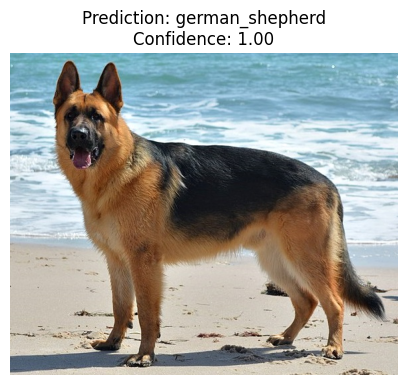

In [121]:
img_path="drive/My Drive/dataset/sample_to_test/German_Shepherd_dog.jpg"
predict_breed(img_path, full_model)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


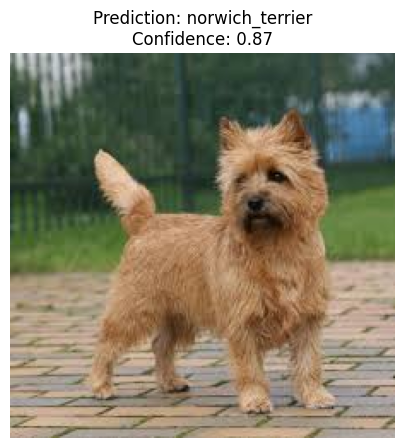

In [120]:
img_path="drive/My Drive/dataset/sample_to_test/carin_dog.jpeg"
predict_breed(img_path, full_model)